# FPP optimization workflow 

In [275]:
using Revise
using FUSE
using IMAS
using Plots;
FUSE.logging(Logging.Info; actors=Logging.Debug);

## Make new FPP equilibirum from scratch

### Initialize from FPP v1 demount

In [276]:
dd = IMAS.dd()
ini, act = FUSE.case_parameters(:FPP, version=:v2);

### Modify ini

In [277]:
ini.equilibrium.R0 = 5.0
ini.equilibrium.B0 = 6.0
ini.equilibrium.ip = 8.5e6
ini.equilibrium.ϵ = missing # 1/3.5
ini.equilibrium.κ = missing # 2.1
ini.equilibrium.δ = missing # 0.6
ini.equilibrium.ζ = 0.0
ini.equilibrium.pressure_core = 1.5e6
ini.equilibrium.field_null_surface = 0.8
ini.equilibrium.xpoints = :lower

ini.core_profiles.impurity = :Kr
ini.core_profiles.n_shaping = 2.5
ini.core_profiles.T_shaping = 2.5
ini.core_profiles.T_ratio = 0.825

ini.core_profiles.greenwald_fraction = 1.1
ini.core_profiles.greenwald_fraction_ped = 0.75

ini.core_profiles.ne_ped = missing
ini.core_profiles.helium_fraction = 0.04
ini.core_profiles.zeff = 1.75

ini.ec_launcher[1].power_launched = 25.0e6 #W

mhx_order = 5
R0 = ini.equilibrium.R0
eps = 1/3.5
a = R0*eps
kapu = 2.0
kapl = 2.2
delu = 0.5
dell = 0.7
zetaou = -0.0
zetaol = -0.4
zetaiu = -0.0
zetail = -0.2
upnull = false
lonull = true

r, z, zref = try
    IMAS.boundary_shape(; a, eps, kapu, kapl, delu, dell, zetaou, zetaiu, zetaol, zetail, zoffset=0.0, upnull, lonull)
catch e
    [NaN], [NaN], [NaN]
end

mxh = IMAS.MXH(r, z, mhx_order)
mxh_vect = IMAS.flat_coeffs(mxh)

ini.equilibrium.boundary_from = :MXH_params
ini.equilibrium.MXH_params = mxh_vect

#plot(r, z; aspect_ratio=:equal, lw=2, label="numerical")
#display(plot!(mxh,label="MXH"))
#display(mxh)

ini.build.plasma_gap = 0.125
ini.build.divertors = :lower
ini.build.symmetric = false
ini.build.n_first_wall_conformal_layers = 2

ini.pf_active.n_coils_outside = 6
ini.pf_active.n_coils_inside = 0
ini.pf_active.technology = :Nb3Sn
ini.tf.shape = :princeton_D #_scaled
ini.oh.n_coils = 6

ini.requirements.flattop_duration = 24*3600.0

86400.0

In [278]:
R0 = ini.equilibrium.R0
ϵ = eps
a = R0*ϵ

RiPlasma = R0 - a

layers = FUSE.OrderedCollections.OrderedDict{String,Float64}()

# HFS layers

layers["plasma"] = 2*a*(1+ini.build.plasma_gap)
layers["hfs first wall"] = 0.02
layers["hfs blanket"] = 0.55*((1/ϵ-1.8)/2.2)^0.5
layers["hfs high temp shield"] = RiPlasma*0.05
layers["hfs gap high temp shield vacuum vessel"] = RiPlasma * 0.02
layers["hfs vacuum vessel"] = RiPlasma * 0.05
layers["hfs gap vacuum vessel low temp shield"] = RiPlasma * 0.02
layers["hfs low temp shield"] = 0.45-0.15*((1/ϵ-1.8)/2.2)^0.5
layers["hfs gap low temp shield TF"] = RiPlasma * 0.02

rbCenterPost = (R0 - 0.5*layers["plasma"] - layers["hfs first wall"] - layers["hfs blanket"]
    - layers["hfs high temp shield"] - layers["hfs gap high temp shield vacuum vessel"]
    - layers["hfs vacuum vessel"] - layers["hfs gap vacuum vessel low temp shield"]
    - layers["hfs low temp shield"] - layers["hfs gap low temp shield TF"]);

layers["hfs TF"] = rbCenterPost * 0.25
layers["OH"] = rbCenterPost * 0.25
layers["gap TF OH"] = RiPlasma * 0.02
layers["gap OH"] = rbCenterPost - layers["hfs TF"] - layers["gap TF OH"] - layers["OH"]

# LFS layers

layers["lfs first wall"] = 0.02
layers["lfs blanket"] = 1.0 - 0.25*((1/ϵ-2.1)/1.9)^0.5
layers["lfs high temp shield"] = RiPlasma * 0.05
layers["lfs gap high temp shield vacuum vessel"] = RiPlasma * 0.4
layers["lfs vacuum vessel"] = RiPlasma * 0.05
layers["lfs gap vacuum vessel low temp shield"] = RiPlasma * 0.02
layers["lfs low temp shield"] = 0.45-0.15*((1/ϵ-1.8)/2.2)^0.5
layers["lfs gap low temp shield TF"] = RiPlasma * 0.02
layers["lfs TF"] = layers["hfs TF"]
layers["gap cryostat"] = RiPlasma * 0.6
layers["cryostat"] = 0.2

for layer in ini.build.layers
    layer.thickness = layers[layer.name]
    if occursin("vacuum vessel", layer.name) || occursin("shield", layer.name) || occursin("blanket", layer.name)
        layer.shape = :rectangle_ellipse
    end
end


### Modify act

In [279]:
act.ActorEquilibrium.model = :TEQUILA
act.ActorEquilibrium.symmetrize = false

act.ActorECsimple.rho_0 = [0.5]
act.ActorECsimple.width = [0.05]

act.ActorPedestal.update_core_profiles = false
act.ActorPedestal.only_powerlaw = false
act.ActorPedestal.T_ratio_pedestal = 1.0

act.ActorHFSsizing.do_plot = true
act.ActorHFSsizing.verbose = true
act.ActorHFSsizing.j_tolerance = 0.5
act.ActorHFSsizing.stress_tolerance = 0.01
act.ActorHFSsizing.error_on_technology = false
act.ActorHFSsizing.error_on_performance = false
act.ActorFluxSwing.operate_oh_at_j_crit = true

act.ActorLFSsizing.maintenance = :vertical
act.ActorLFSsizing.tor_modularity = 2
act.ActorLFSsizing.pol_modularity = 1
act.ActorLFSsizing.verbose = true

act.ActorPFactive.do_plot = true
act.ActorPFactive.update_equilibrium = false
act.ActorCXbuild.rebuild_wall = false

act.ActorPFdesign.do_plot = true
act.ActorPFdesign.symmetric = false

act.ActorPowerNeeds.model = :thermal_power_fraction
act.ActorPowerNeeds.thermal_power_fraction = 0.2

act.ActorThermalCycle.power_cycle_type = :fixed_cycle_efficiency
act.ActorThermalCycle.fixed_cycle_efficiency = 0.4

act.ActorStabilityLimits.raise_on_breach = false

act.ActorCosting.model = :GASC
act.ActorCosting.production_increase = 10.0
act.ActorCosting.learning_rate = 0.616

act.ActorFixedProfiles.T_shaping = ini.core_profiles.T_shaping
act.ActorFixedProfiles.n_shaping = ini.core_profiles.n_shaping
act.ActorFixedProfiles.T_ratio_pedestal = 1.0
act.ActorFixedProfiles.T_ratio_core = ini.core_profiles.T_ratio
act.ActorFixedProfiles.update_pedestal = true

act.ActorCoreTransport.model = :FixedProfiles

act.ActorStationaryPlasma.convergence_error = 5e-3
act.ActorStationaryPlasma.max_iter = 8
act.ActorStationaryPlasma.do_plot = true

act.ActorTEQUILA.debug = true
act.ActorTEQUILA.number_of_iterations = 50
act.ActorTEQUILA.tolerance = 0.0005
#act.ActorTEQUILA.ip_from = :pulse_schedule

0.0005

## Run WholeFacility Actor

Ip_target = 8.5e6
ITERATION 1
    Concentric surfaces used for first iteration
    Status: Ψaxis = -27.275754205699116, Error: 1.0
ITERATION 2
    Status: Ψaxis = -27.674187275836676, Error: 0.014397281703930892

[ Info: Equilibrium
[ Info:  TEQUILA



ITERATION 3
    Status: Ψaxis = -28.038332085478803, Error: 0.012987391993645713
ITERATION 4
    Status: Ψaxis = -28.361318721074888, Error: 0.011388279888271829


ITERATION 5
    Status: Ψaxis = -28.64337073204493, Error: 0.009847025813009285
ITERATION 6
    Status: Ψaxis = -28.879852341006533, Error: 0.00818846322928818


ITERATION 7
    Status: Ψaxis = -29.062034907194736, Error: 0.006268747758715996
ITERATION 8
    Status: Ψaxis = -29.185200979231368, Error: 0.004220155006788507


ITERATION 9
    Status: Ψaxis = -29.255212646395893, Error: 0.0023931347897124433
ITERATION 10
    Status: Ψaxis = -29.287735227056853, Error: 0.0011104505148255431


ITERATION 11
    Status: Ψaxis = -29.302210451623388, Error: 0.0004939976999493978
DONE: Successful convergence


[ Info: HCD
[ Info:  ECsimple
[ Info:  ICsimple
[ Info:  LHsimple
[ Info:  NBsimple


[ Info: SteadyStateCurrent
[ Info: CXbuild


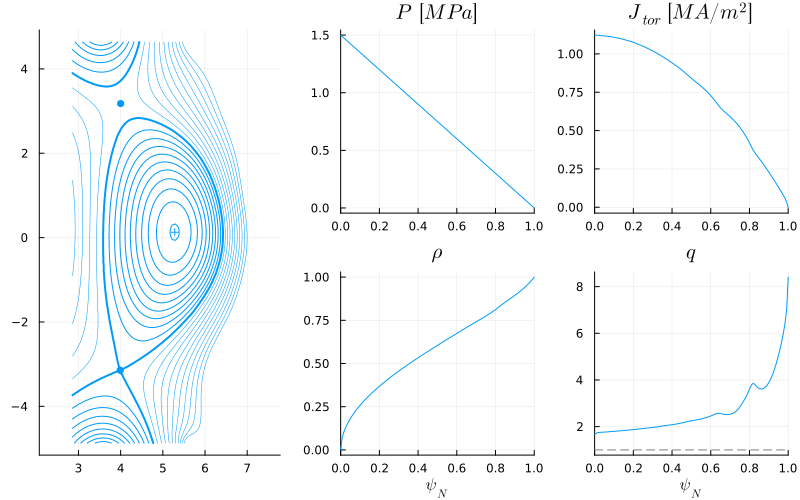

0.024915698492325333

In [280]:
dd = IMAS.dd()
FUSE.init(dd, ini, act; do_plot=false);
mxh_plot = plot(dd.equilibrium, show_x_points=true)
display(mxh_plot)
eq = dd.equilibrium.time_slice[]
dRsep = maximum(eq.boundary_secondary_separatrix.outline.r) - maximum(eq.boundary.outline.r)

In [281]:
# modify secondary X point

XP2_R = 4.0
XP2_Z = 4.0

dd.pulse_schedule.position_control.x_point[1].r.reference.data .= XP2_R
dd.pulse_schedule.position_control.x_point[1].z.reference.data .= XP2_Z

display(dd.pulse_schedule.position_control.x_point)

# modify outer strike point

if false
    OSP_R = 4.5
    OSP_Z = -3.75

    pc = dd.pulse_schedule.position_control
    time0 = 100.0

    resize!(pc.strike_point, 1; wipe=false)

    IMAS.set_time_array(pc.strike_point[1].r.reference, :data, time0, OSP_R)
    IMAS.set_time_array(pc.strike_point[1].z.reference, :data, time0, OSP_Z)

    display(dd.pulse_schedule.position_control.strike_point)
end

x_point
├─ 1
│  ├─ r
│  │  └─ reference
│  │     ├─ data ➡ [4,4,4] [mixed]
│  │     └─ time ➡ [-Inf,100,Inf] [s]
│  └─ z
│     └─ reference
│        ├─ data ➡ [4,4,4] [mixed]
│        └─ time ➡ [-Inf,100,Inf] [s]
└─ 2
   ├─ r
   │  └─ reference
   │     ├─ data ➡ [3.98931,3.98931,3.98931] [mixed]
   │     └─ time ➡ [-Inf,100,Inf] [s]
   └─ z
      └─ reference
         ├─ data ➡ [-3.14225,-3.14225,-3.14225] [mixed]
         └─ time ➡ [-Inf,100,Inf] [s]


[ Info: WholeFacility


[ Info:  StationaryPlasma


Jtor0_before = 0.58 MA/m²
P0_before = 1699.86 kPa
βn_MHD = 4.81
βn_tot = 4.10
Te_ped = 3.06e+03 eV
rho_ped = 0.9500


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple


[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple


Ip_target = 8.5e6
ITERATION 1
    Concentric surfaces used for first iteration

[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



    Status: Ψaxis = -25.67703092975627, Error: 1.0
ITERATION 2
    Status: Ψaxis = -26.29460300151854, Error: 0.023486647496697433


ITERATION 3
    Status: Ψaxis = -26.69149347548797, Error: 0.014869549144333737


ITERATION 4
    Status: Ψaxis = -26.92906891301691, Error: 0.008822267056329611


ITERATION 5
    Status: Ψaxis = -27.06075078024519, Error: 0.004866157199319492
ITERATION 6
    Status: Ψaxis = -27.122319587171408, Error: 0.002270042085756527


ITERATION 7
    Status: Ψaxis = -27.135042327306405, Error: 0.00046886752493449706
DONE: Successful convergence



Jtor0_after = 0.73 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 4.32
     βn_tot = 3.98
     Te_ped = 2.28e+03 eV
    rho_ped = 0.9472


[ Info: Iteration = 1 , convergence error = 0.04564, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple


Ip_target = 8.5e6
ITERATION 1
    Status: Ψaxis = -29.35337193775307, Error: 0.07557324641103819

[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



ITERATION 2
    Status: Ψaxis = -29.297790027826043, Error: 0.0018971366056701972
ITERATION 3
    Status: Ψaxis = -29.340691638093432, Error: 0.0014621881036945082


ITERATION 4
    Status: Ψaxis = -29.429461978272666, Error: 0.0030163765903967995
ITERATION 5
    Status: Ψaxis = -29.535790381804016, Error: 0.003599985040415758


ITERATION 6
    Status: Ψaxis = -29.64483189885413, Error: 0.0036782639693203074
ITERATION 7
    Status: Ψaxis = -29.74919410432631, Error: 0.0035080683230005404


ITERATION 8
    Status: Ψaxis = -29.845548114665426, Error: 0.0032284215377425046
ITERATION 9
    Status: Ψaxis = -29.932708532223874, Error: 0.0029118787384247325


ITERATION 10
    Status: Ψaxis = -30.0106125832808, Error: 0.0025958834009382095
ITERATION 11
    Status: Ψaxis = -30.079744600945123, Error: 0.002298291377851357


ITERATION 12
    Status: Ψaxis = -30.14080930080166, Error: 0.0020259807640570894


ITERATION 13
    Status: Ψaxis = -30.194613457698715, Error: 0.0017819124252884393


ITERATION 14
    Status: Ψaxis = -30.241937139442648, Error: 0.0015648363240002763
ITERATION 15


    Status: Ψaxis = -30.28352791349058, Error: 0.0013733794215371113
ITERATION 16
    Status: Ψaxis = -30.320055780235535, Error: 0.0012047427290277463


ITERATION 17
    Status: Ψaxis = -30.35213564372336, Error: 0.0010569227768478448


ITERATION 18
    Status: Ψaxis = -30.3803095244162, Error: 0.0009273730628121905


ITERATION 19
    Status: Ψaxis = -30.40505169690663, Error: 0.0008137520283494316


ITERATION 20
    Status: Ψaxis = -30.42678276229431, Error: 0.0007142084510692937
ITERATION 21


    Status: Ψaxis = -30.4458651546486, Error: 0.0006267646610586998
ITERATION 22
    Status: Ψaxis = -30.46263005586116, Error: 0.0005503431969535933


ITERATION 23
    Status: Ψaxis = -30.47736364821581, Error: 0.000483427389741259
DONE: Successful convergence



Jtor0_after = 0.64 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 3.59
     βn_tot = 3.99
     Te_ped = 1.89e+03 eV
    rho_ped = 0.9618


[ Info: Iteration = 2 , convergence error = 0.03588, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple


[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium


Ip_target = 8.5e6
ITERATION 1
    Status: Ψaxis = -30.53297855407455, Error: 0.001821470046240141

[ Info:    TEQUILA



ITERATION 2
    Status: Ψaxis = -30.429223061616952, Error: 0.0034097318964569213


ITERATION 3
    Status: Ψaxis = -30.381928326737135, Error: 0.0015566732424352248


ITERATION 4
    Status: Ψaxis = -30.36253194130889, Error: 0.000638826349058696


ITERATION 5
    Status: Ψaxis = -30.356468275099047, Error: 0.00019974873739900178


DONE: Successful convergence



Jtor0_after = 1.04 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 3.83
     βn_tot = 3.93
     Te_ped = 1.92e+03 eV
    rho_ped = 0.9462


[ Info: Iteration = 3 , convergence error = 0.04756, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple


[ Info:    LHsimple
[ Info:    NBsimple


Ip_target = 8.5e6
ITERATION 1
    Status: Ψaxis = -29.653982371000094, Error: 0.023689428802855985

[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



ITERATION 2
    Status: Ψaxis = -29.60565869441298, Error: 0.001632244601814339


ITERATION 3
    Status: Ψaxis = -29.556789535319655, Error: 0.001653398757497919


ITERATION 4
    Status: Ψaxis = -29.510403901535362, Error: 0.00157184001747533


ITERATION 5
    Status: Ψaxis = -29.467770389285516, Error: 0.0014467844593138274
ITERATION 6
    Status: Ψaxis = -29.42927102639954, Error: 0.00130819967818569


ITERATION 7
    Status: Ψaxis = -29.394878099029363, Error: 0.0011700312977760978
ITERATION 8
    Status: Ψaxis = -29.364364426050322, Error: 0.0010391395685026502


ITERATION 9
    Status: Ψaxis = -29.33740591633884, Error: 0.0009189125237711167
ITERATION 10
    Status: Ψaxis = -29.313669341785793, Error: 0.0008097442280694769


ITERATION 11
    Status: Ψaxis = -29.292799271533234, Error: 0.0007124641813539912
ITERATION 12
    Status: Ψaxis = -29.27448058125472, Error: 0.0006257562872094948


ITERATION 13
    Status: Ψaxis = -29.25841685933332, Error: 0.0005490290878905652
ITERATION 14
    Status: Ψaxis = -29.24433865230562, Error: 0.00048139939819057305


DONE: Successful convergence



Jtor0_after = 1.00 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 4.01
     βn_tot = 3.92
     Te_ped = 1.87e+03 eV
    rho_ped = 0.9465


[ Info: Iteration = 4 , convergence error = 0.01609, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple


Ip_target = 8.5e6
ITERATION 1

[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



    Status: Ψaxis = -29.51100698511416, Error: 0.009036232919569792


ITERATION 2
    Status: Ψaxis = -29.527825062994417, Error: 0.0005695671064284705


ITERATION 3
    Status: Ψaxis = -29.54305396501443, Error: 0.0005154816437747886


ITERATION 4
    Status: Ψaxis = -29.55683481600032, Error: 0.00046624921347898906
DONE: Successful convergence



Jtor0_after = 0.91 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 3.90
     βn_tot = 3.93
     Te_ped = 1.85e+03 eV
    rho_ped = 0.9479


[ Info: Iteration = 5 , convergence error = 0.00601, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple


[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium


Ip_target = 8.5e6
ITERATION 1
    Status: Ψaxis = -29.749494184359115, Error: 0.006476055262145867

[ Info:    TEQUILA



ITERATION 2
    Status: Ψaxis = -29.76245767927254, Error: 0.00043556533714798456


DONE: Successful convergence



Jtor0_after = 0.95 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 3.88
     βn_tot = 3.93
     Te_ped = 1.85e+03 eV
    rho_ped = 0.9473


[ Info: Iteration = 6 , convergence error = 0.0051, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple


Ip_target = 8.5e6

[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



ITERATION 1
    Status: Ψaxis = -29.72670012071891, Error: 0.0012028768214574876


ITERATION 2
    Status: Ψaxis = -29.732519653120857, Error: 0.00019572954024218967


DONE: Successful convergence


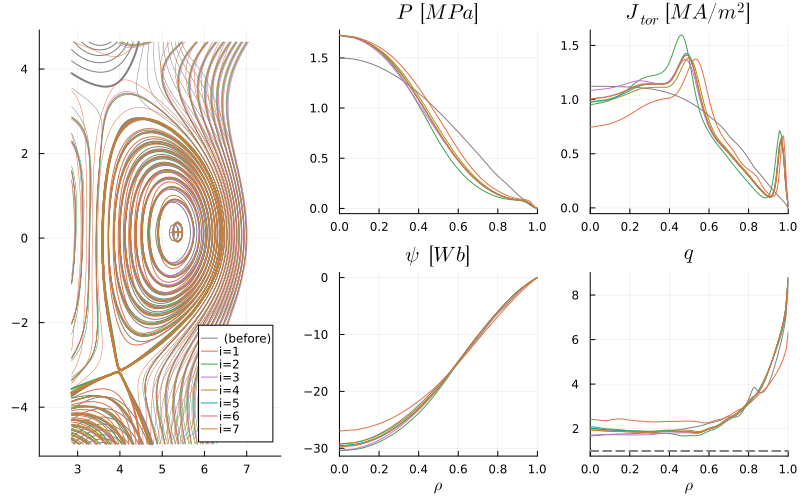

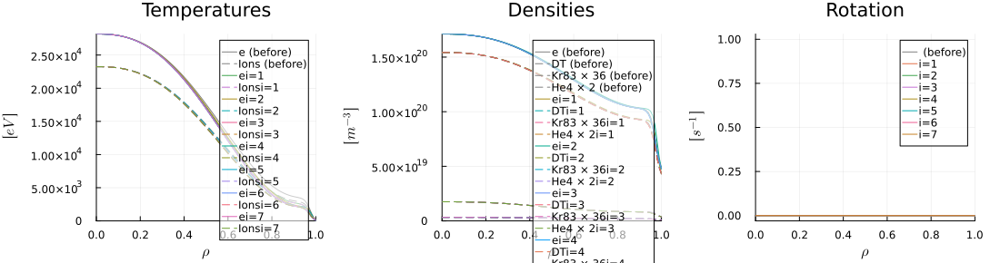

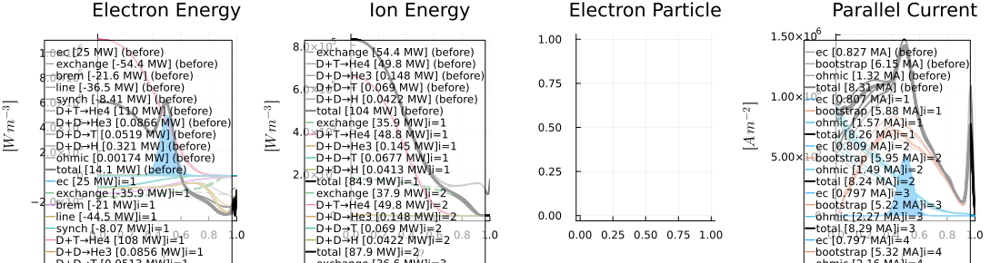


Jtor0_after = 0.96 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 3.90
     βn_tot = 3.92
     Te_ped = 1.86e+03 eV
    rho_ped = 0.9470


[ Info: Iteration = 7 , convergence error = 0.00108, threshold = 0.005


[ Info:  StabilityLimits
[ Info:  HFSsizing


[ Info:   FluxSwing
[ Info:   Stresses


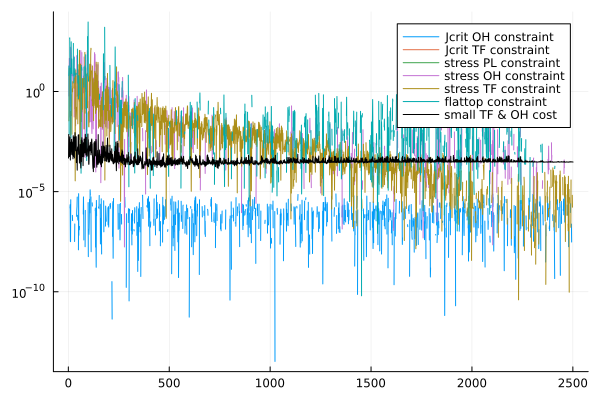

(0.0003003459085426718, [-6.095412800798194e-7, -0.0007137080657051551, -0.015113722199493213, -0.0755074897550065, -1.2502882831061875e-7, 0.0], [0.0])
Optimization Result
  Iteration:       50
  Minimum:         0.000300346
  Minimizer:       [0.283478, 0.338287, 0.734054, 0.79876]
  Function calls:  2500
  Feasibles:       50 / 50 in final population
  Total time:      5.2244 s
  Stop reason:     Maximum number of iterations exceeded.
[PL.thickness] = 

[ Info:   FluxSwing
[ Info:   Stresses


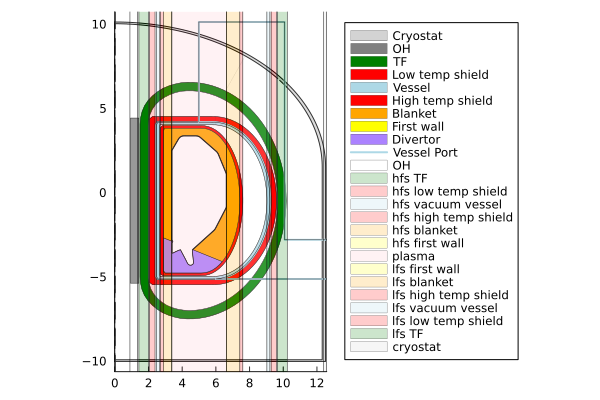

[0.9009372973876343]
[OH.thickness, dd.build.oh.technology.fraction_steel] = [0.4605852935480793, 0.7340535556637959]
[TFhfs.thickness, dd.build.tf.technology.fraction_steel] = [0.566919915656882, 0.7987596341336972]

target_B0 = 6.000104066661404
(dd.build.tf.max_b_field * TFhfs.end_radius) / R0 = 6.006791835859173

dd.build.oh.flattop_duration = 98884.30167145345
dd.requirements.flattop_duration = 86400.0
dd.build.oh.flattop_duration / dd.requirements.flattop_duration = 1.144494232308489

dd.build.oh.max_j = 3.43348904382727e7
dd.build.oh.critical_j = 5.154257655826095e7
dd.build.oh.critical_j / dd.build.oh.max_j = 1.5011720119196024

dd.build.tf.max_j = 2.456157986100529e7
dd.build.tf.critical_j = 5.080208514144321e7
dd.build.tf.critical_j / dd.build.tf.max_j = 2.068355758421637

maximum(cs.stress.vonmises.oh) = 7.709185621992308e8
cs.properties.yield_strength.oh = 8.0e8
cs.properties.yield_strength.oh / maximum(cs.stress.vonmises.oh) = 1.037723099723799

maximum(cs.stress.vonmises.

vertical maintenance (tor_modularity=2, pol_modularity=1) requires lfs port wall at 10.083527490939698 [m]
ripple_TF_radius = 8.830888237987441 [m], maintenance_TF_radius = 9.516607575282816 [m]
old_TF_radius = 9.670328539116701 [m], new_TF_radius = 9.516607575282816 [m]
TF outer leg radius changed by -0.15372096383388545 [m]


[ Info:  LFSsizing
[ Info:  CXbuild


[ Info:  PassiveStructures


[ Info:  PFdesign


[ Info:   PFactive


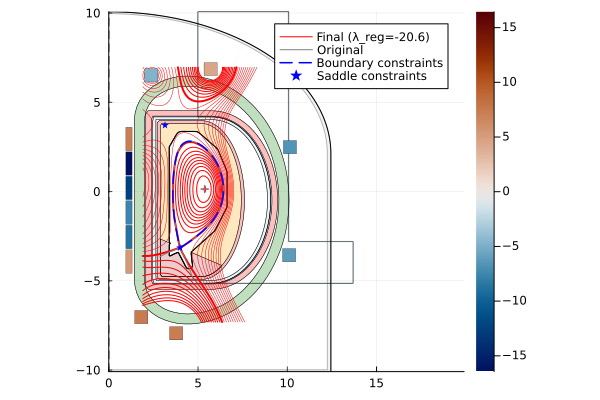

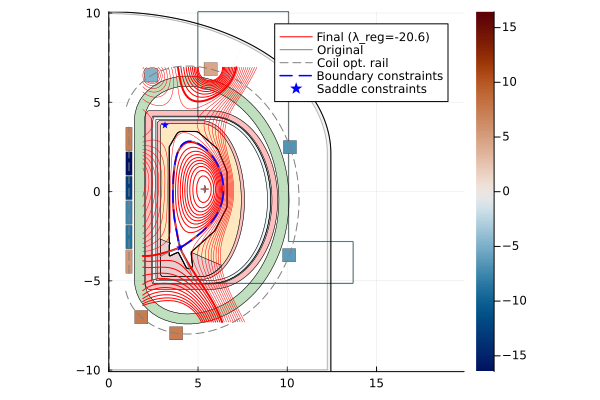

[ Info:  Neutronics


[ Info:  Blanket


[ Info:   CXbuild


[ Info:  Divertors


[ Info:  BalanceOfPlant
[ Info:   HeatTransfer


[ Info:   ThermalCycle


[ Info:   PowerNeeds


[ Info:  Costing
[ Info:   GASCCosting
[ Info:    SheffieldCosting
┌ Warning: Inflation data not available for 2010
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122


┌ Warning: Inflation data not available for 1983
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122
┌ Warning: Inflation data not available for 1983
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122
┌ Warning: Inflation data not available for 1983
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122


In [282]:
FUSE.ActorWholeFacility(dd, act);

## Summary

In [283]:
show(FUSE.timer)

 ────────────────────────────────────────────────────────────────────────────────
                                        Time                    Allocations      
                               ───────────────────────   ────────────────────────
       Tot / % measured:            23.6h /   0.1%            601GiB /   1.5%    

 Section               ncalls     time    %tot     avg     alloc    %tot      avg
 ────────────────────────────────────────────────────────────────────────────────
 WholeFacility              2    74.9s   90.9%   37.4s   6.63GiB   72.8%  3.32GiB
   StationaryPlasma         2    42.2s   51.2%   21.1s   3.24GiB   35.5%  1.62GiB
     Equilibrium           14    37.3s   45.3%   2.66s   2.97GiB   32.6%   217MiB
       TEQUILA             14    35.9s   43.6%   2.57s   2.66GiB   29.2%   195MiB
     HCD                   16    1.10s    1.3%  69.0ms   34.2MiB    0.4%  2.14MiB
       NBsimple            16    257ms    0.3%  16.1ms   6.70MiB    0.1%   429KiB
       LHsimple

    2.60s    3.2%   519μs    517MiB    5.5%   106KiB
     Stresses           5.00k    2.22s    2.7%   443μs    427MiB    4.6%  87.4KiB
   Blanket                  2    3.17s    3.8%   1.58s    610MiB    6.5%   305MiB
     CXbuild                2    188ms    0.2%  94.0ms   83.3MiB    0.9%  41.6MiB
   BalanceOfPlant           2    330ms    0.4%   165ms   4.64MiB    0.0%  2.32MiB
     ThermalCycle           2   81.8ms    0.1%  40.9ms   1.85MiB    0.0%   946KiB
     HeatTransfer           2   78.4ms    0.1%  39.2ms   1.01MiB    0.0%   518KiB
     PowerNeeds             2   56.6ms    0.1%  28.3ms    952KiB    0.0%   476KiB
   Neutronics               2    285ms    0.3%   143ms   11.7MiB    0.1%  5.85MiB
   Costing                  2    275ms    0.3%   138ms   15.8MiB    0.2%  7.89MiB
     GASCCosting            2    221ms    0.3%   110ms   15.0MiB    0.2%  7.48MiB
       SheffieldCos...      2    173ms    0.2%  86.6ms   14.1MiB    0.2%  7.06MiB
   Divertors                2    265ms    0.3

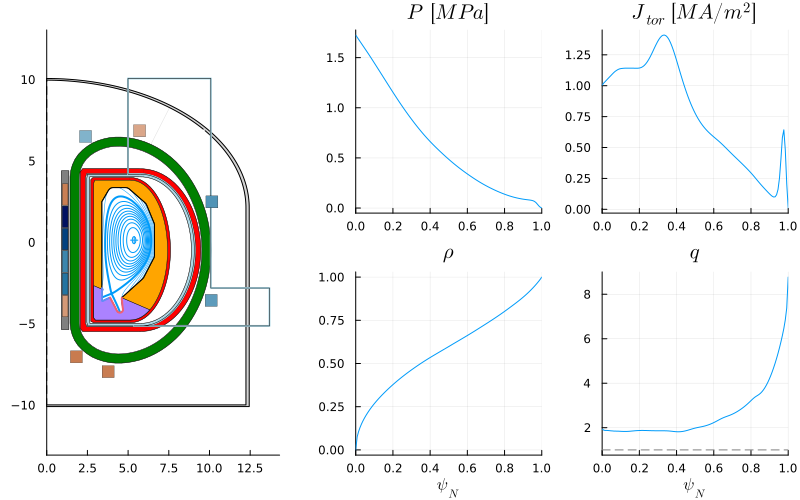

GEOMETRY                         EQUILIBRIUM                      TEMPERATURES                     DENSITIES                        
─────────────────────────────    ─────────────────────────────    ─────────────────────────────    ─────────────────────────────    
R0 → 5 [m]                       B0 → 6 [T]                       Te0 → 28.2 [keV]                 ne0 → 1.71e+20 [m⁻³]             
a → 1.43 [m]                     ip → 8.3 [MA]                    Ti0 → 23.2 [keV]                 ne_ped → 9.54e+19 [m⁻³]          
1/ϵ → 3.5                        q95 → 5.49                       <Te> → 11.3 [keV]                <ne> → 1.24e+20 [m⁻³]            
κ → 2.1                          <Bpol> → 0.707 [T]               <Ti> → 9.55 [keV]                ne0/<ne> → 1.38                  
δ → 0.506                        βpol_MHD → 2.54                  Te0/<Te> → 2.49                  fGW → 1.09                       
ζ → -0.0605                      βtor_MHD → 0.0381                Ti0

24×9 DataFrame
 Row │ group   details     type      ΔR         R_start    R_end      material      area        volume     
     │ String  String      String    Float64    Float64    Float64    String        Float64     Float64    
─────┼─────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                            0.900937    0.0        0.900937                  8.78277     24.8586
   2 │ in                  oh        0.460585    0.900937   1.36152   ReBCO           4.49001     31.9137
   3 │ in                            0.0714309   1.36152    1.43295                   0.696342     6.11326
   4 │ hfs                 tf        0.56692     1.43295    1.99987   ReBCO          20.1926     253.732
   5 │ hfs                           0.0714309   1.99987    2.0713                   14.0396     458.527
   6 │ hfs     low temp    shield    0.318153    2.0713     2.38946   Steel           9.25587    304.794
   7 │ hfs                 

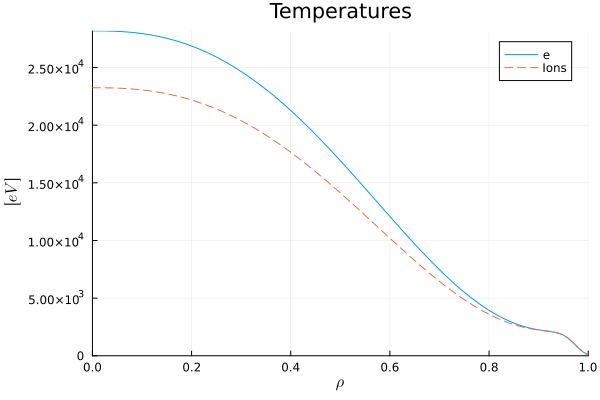

​
​


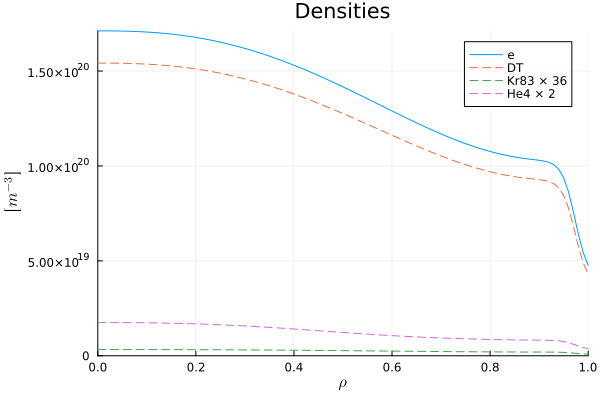

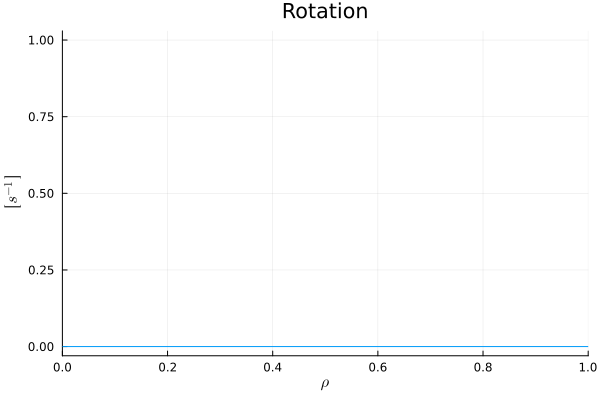

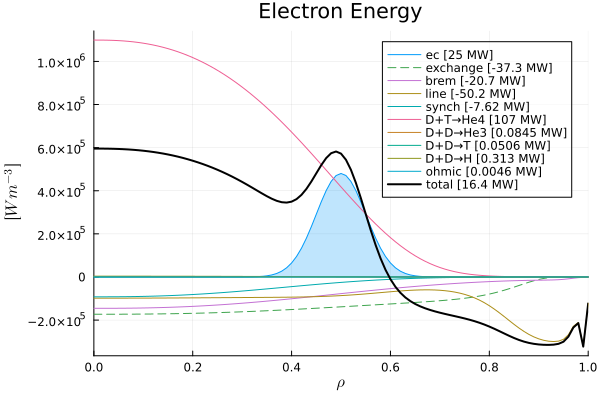

​
​
​


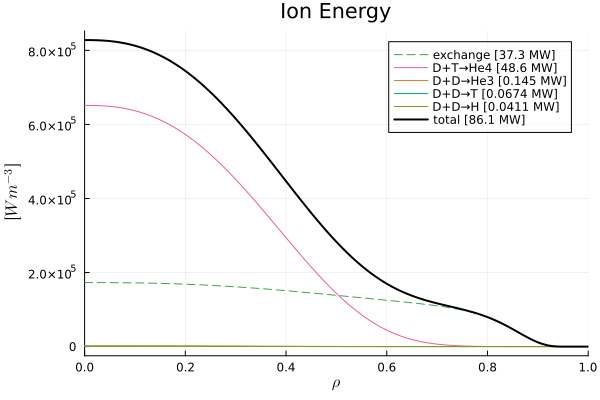

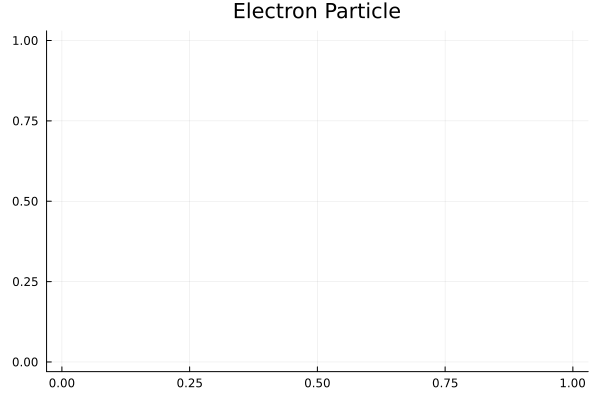

​
​


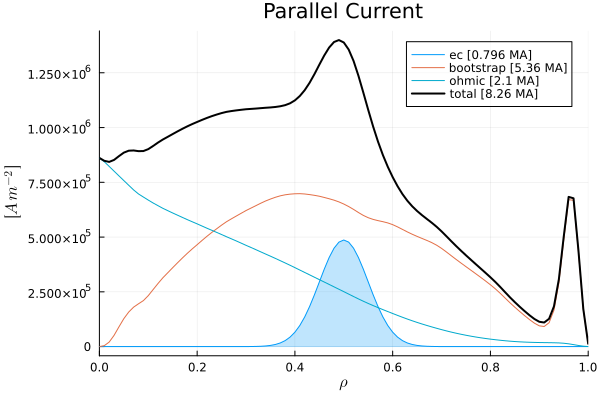

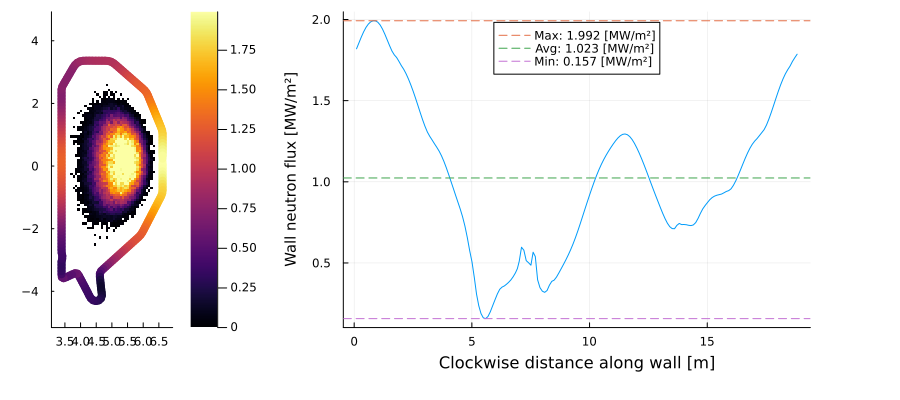

​
​


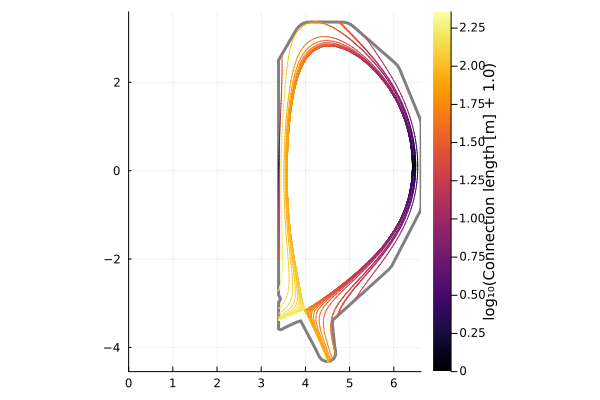

​


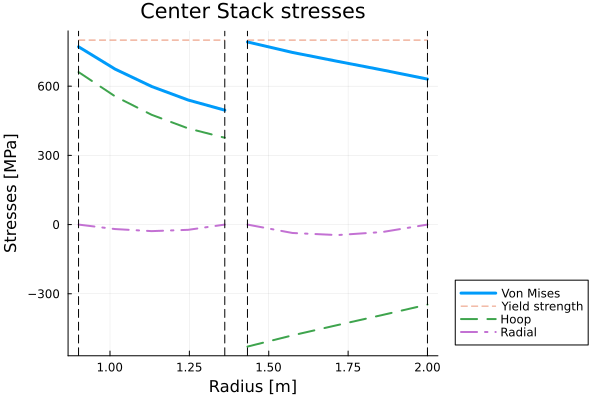

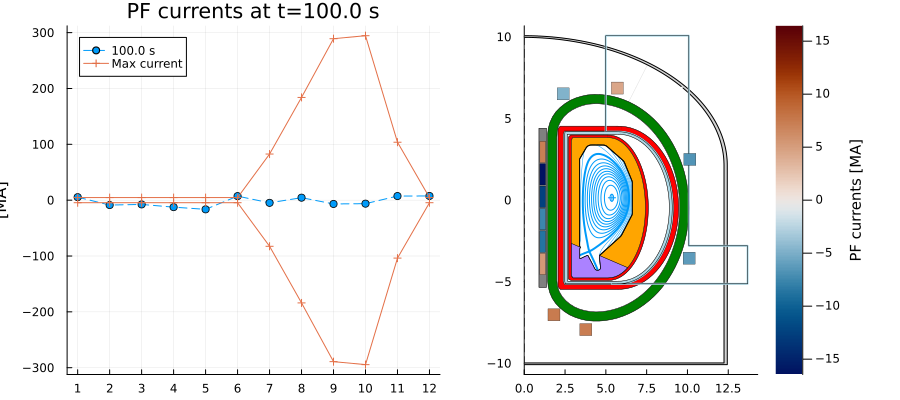

​
​


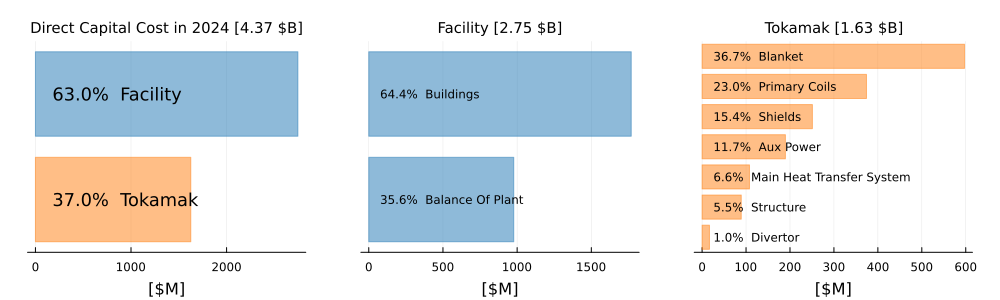

​


In [284]:
FUSE.digest(dd)

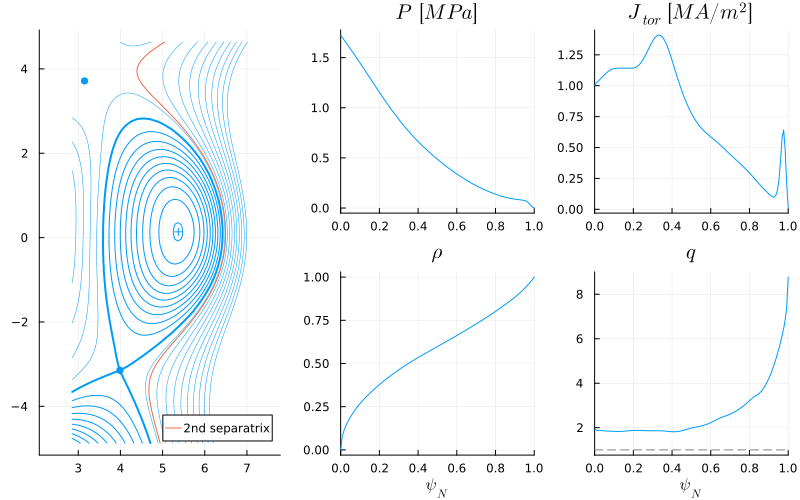

0.0701974441118276

In [285]:
eq = dd.equilibrium.time_slice[]

plot(eq, show_x_points=true)
display(plot!(eq.boundary_secondary_separatrix.outline.r,eq.boundary_secondary_separatrix.outline.z,label="2nd separatrix"))

dRsep = maximum(eq.boundary_secondary_separatrix.outline.r) - maximum(eq.boundary.outline.r)

In [286]:
if false
    savedir = "FPP_build_TEQUILA_MXH/"
    FUSE.save(savedir,dd,ini,act)
end

profiles_1d
├─ current_parallel_inside ➡ 101-element Vector{Float64} [A]
├─ electrons
│  ├─ energy ➡ 101-element Vector{Float64} [W.m^-3]
│  ├─ particles ➡ 101-element Vector{Float64} [m^-3.s^-1] (all 0.0)
│  ├─ particles_inside ➡ 101-element Vector{Float64} [s^-1] (all 0.0)
│  └─ power_inside ➡ 101-element Vector{Float64} [W]
├─ grid
│  ├─ area ➡ 101-element Vector{Float64} [m^2]
│  ├─ psi ➡ Function [Wb]
│  ├─ psi_norm ➡ Function
│  ├─ rho_tor_norm ➡ 101-element Vector{Float64}
│  ├─ surface ➡ 101-element Vector{Float64} [m^2]
│  └─ volume ➡ 101-element Vector{Float64} [m^3]
├─ j_parallel ➡ 101-element Vector{Float64} [A.m^-2]
├─ momentum_tor ➡ 101-element Vector{Float64} [kg.m^-1.s^-2] (all 0.0)
├─ time ➡ 100 [s]
├─ torque_tor_inside ➡ 101-element Vector{Float64} [kg.m^2.s^-2] (all 0.0)
├─ total_ion_energy ➡ 101-element Vector{Float64} [W.m^-3]
└─ total_ion_power_inside ➡ 101-element Vector{Float64} [W]


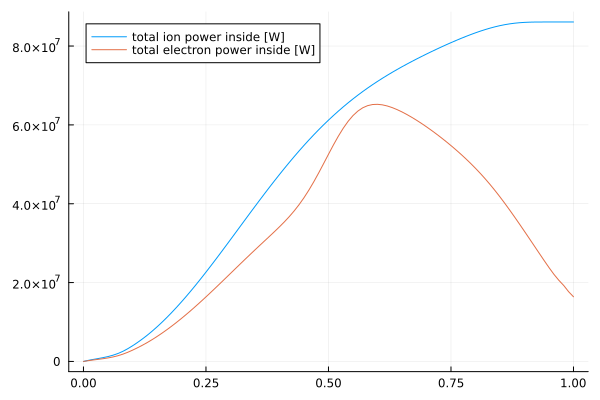

In [287]:
ts = IMAS.total_sources(dd.core_sources, dd.core_profiles.profiles_1d[],)

display(ts)

plot(ts.grid.rho_tor_norm,ts.total_ion_power_inside,label="total ion power inside [W]")
plot!(ts.grid.rho_tor_norm,ts.electrons.power_inside,label="total electron power inside [W]")

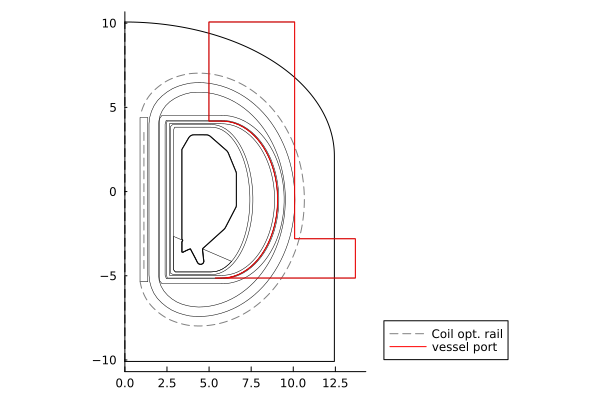

In [288]:
port = dd.build.structure[3]

plot(dd.build, wireframe=true)
plot!(dd.build.pf_active.rail)
plot!(port.outline.r, port.outline.z, color=:red, label="vessel port")
